# Import

In [1]:
import numpy as np
import torch

from matplotlib import pyplot as plt
from PIL import Image
from transformers import AutoModel
from torchvision.io import read_image

device = 'cuda'

# Plot Utils

In [2]:
def plot_qualitative(image, sim, palette, title=None):
    qualitative_plot = np.zeros((sim.shape[0], sim.shape[1], 3)).astype(np.uint8)

    for j in list(np.unique(sim)):
        qualitative_plot[sim == j] = np.array(palette[j])
    plt.axis('off')
    plt.title(title)
    plt.imshow(image)
    plt.imshow(qualitative_plot, alpha=0.6)
    plt.tight_layout()

# Target Image

input_res=(1080, 1920)


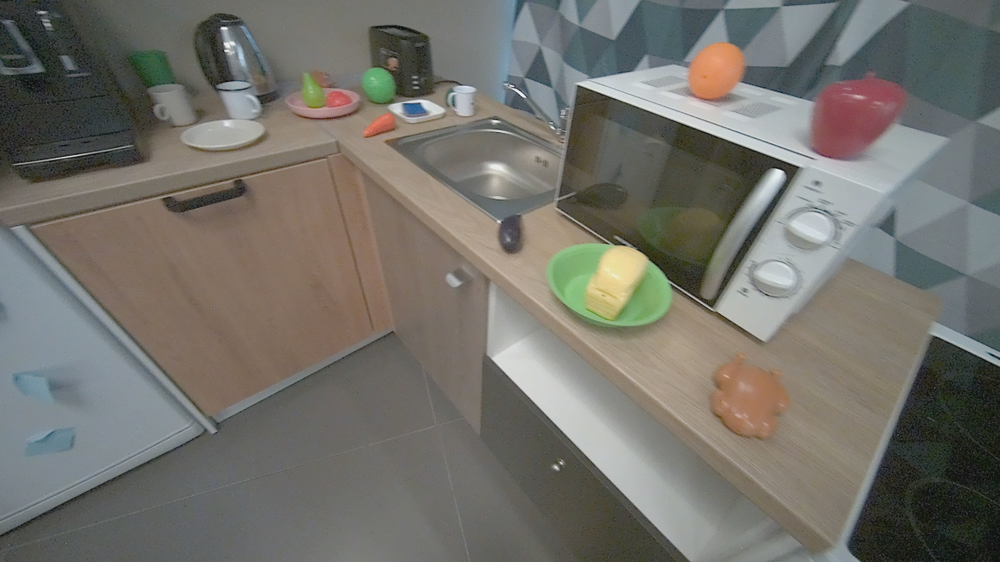

In [3]:
from torchvision.transforms.functional import pil_to_tensor, to_pil_image
from typing import List, Tuple, Dict
from torch.nn import functional as F

def rescale_res(resolution: Tuple[int], desired: Tuple[int]):
    rows, cols = resolution[-2], resolution[-1]
    if len(desired) == 1: # desired min side
        desired_min_side = desired[0]
        if rows <= cols:
            return desired_min_side, int(desired_min_side*cols/rows)
        return int(desired_min_side*rows/cols), desired_min_side
    return desired

@torch.no_grad()
def read_img(img_path: str, desired_res: Tuple[int]=None):
    global image_tensor, image
    image_tensor = read_image(img_path).float()
    image = to_pil_image(image_tensor*255)
    input_res = image_tensor.shape[-2], image_tensor.shape[-1]
    if desired_res:
        input_res = rescale_res(input_res, desired_res)
        
    print(f'{input_res=}')
    
    image_tensor = image_tensor.unsqueeze(0).to(device)
    image_tensor = F.interpolate(image_tensor, input_res, mode='bilinear').squeeze(0)
    
    torch.cuda.empty_cache()

read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/sber.jpg')
image

In [4]:
image_tensor.shape, image_tensor.min(), image_tensor.max()

(torch.Size([3, 1080, 1920]),
 tensor(0., device='cuda:0'),
 tensor(247., device='cuda:0'))

# Model Loading

In [ ]:
model = AutoModel.from_pretrained("lorebianchi98/Talk2DINOv3-ViTB", trust_remote_code=True).to(device).eval()

# Mapping Texts & Images in DINOv2 space 

In [6]:
text = ["an oven"]
text_embed, image_embed = [], []

@torch.no_grad()
def regenerate_embedings():
    global text_embed, image_embed
    text_embed = model.encode_text(text)
    image_embed = model.encode_image(image_tensor)

regenerate_embedings()
text_embed.shape, image_embed.shape

(torch.Size([1, 768]), torch.Size([1, 784, 768]))

In [7]:
# normalize the features to perform cosine similarity
similarity = []
def calc_similarity():
    global similarity
    text_embed_normed = text_embed / text_embed.norm(dim=-1, keepdim=True)
    image_embed_normed = image_embed / image_embed.norm(dim=-1, keepdim=True)
    
    similarity = (image_embed_normed @ text_embed_normed.T).squeeze(0, -1).cpu()
    
    # similarity = torch.cosine_similarity(image_embed, text_embed, dim=-1).squeeze(0, -1).cpu()
    # similarity = torch.cosine_similarity(image_embed, text_embed, dim=-1).unsqueeze(-1)
    
calc_similarity()

In [8]:
def cos_psnr(val: torch.Tensor):
    print(val.std())
    return 10*torch.log10(1/val.std())

print(f'{similarity.shape=} {similarity.min()=} {similarity.max()=} \n{cos_psnr(similarity)=}')

tensor(0.0897)
similarity.shape=torch.Size([784]) similarity.min()=tensor(-0.0303) similarity.max()=tensor(0.4138) 
cos_psnr(similarity)=tensor(10.4698)


similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


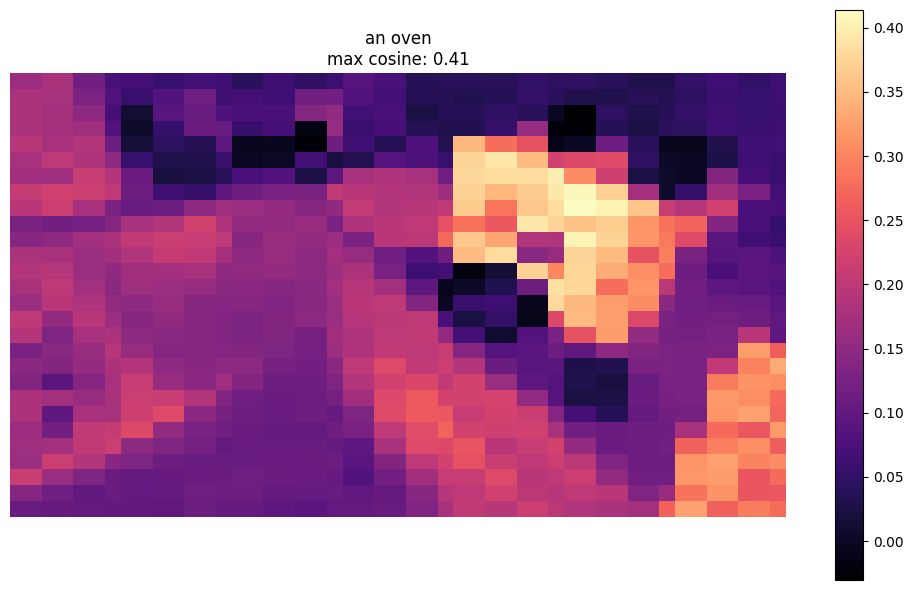

In [9]:

from torch.nn import functional as F
from matplotlib import colormaps
from typing import List, Tuple, Dict

def rescale_res(resolution: Tuple[int], desired: Tuple[int]):
    rows, cols = resolution[-2], resolution[-1]
    if len(desired) == 1: # desired min side
        desired_min_side = desired[0]
        if rows <= cols:
            return desired_min_side, int(desired_min_side*cols/rows)
        return int(desired_min_side*rows/cols), desired_min_side
    return desired

def plot_query_map():
    total = similarity.shape[0]
    k = image.width / image.height

    patches_x_row = total ** 0.5

    h = int(patches_x_row)
    w = int(k * h)

    similarity_reshaped = similarity.reshape(int(patches_x_row), int(patches_x_row)).unsqueeze(0).unsqueeze(0)
    print(f'{similarity_reshaped.shape=}')
    similarity_scaled = F.interpolate(
        similarity_reshaped,
        (h, w)
    ).squeeze().numpy()

    magma = colormaps['magma']
    colorized = magma(similarity_scaled)

    # plt.figure(figsize=(5.52, 6.4))
    # plt.axis('off')
    # # (colorized-colorized.min()) / (colorized.max()-colorized.min())
    # plt.imshow(colorized)
    # # plt.colorbar()
    # plt.title(', '.join(text))
    # plt.tight_layout()
    # plt.show()
    figsize = rescale_res(image_tensor.shape[-2:], [6])[::-1]


    plt.figure(figsize=figsize)
    plt.axis('off')
    plt.imshow(similarity_scaled, cmap='magma')
    plt.colorbar()
    plt.title(text[0] + f'\nmax cosine: {similarity_reshaped.max():.2}')
    plt.tight_layout()
    plt.show()
plot_query_map()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


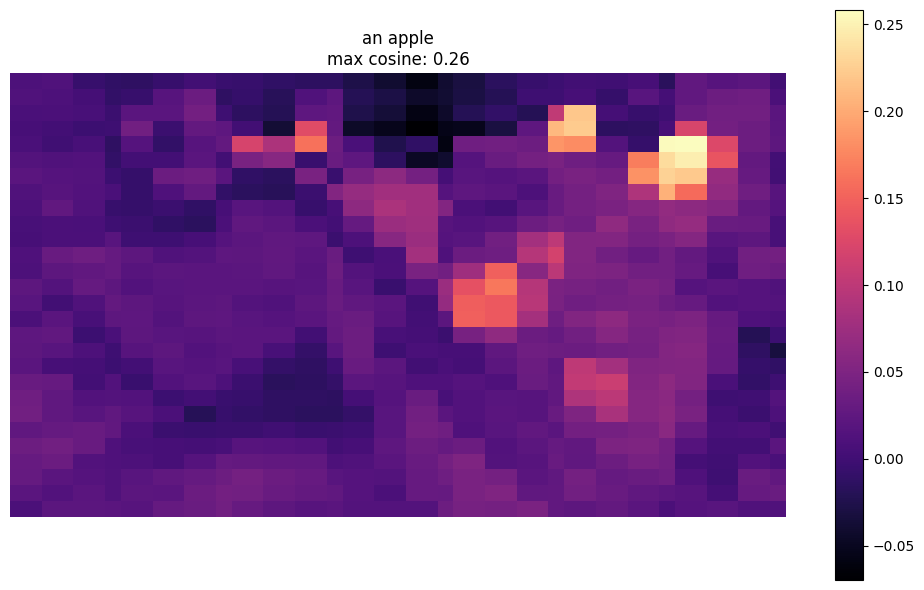

In [10]:
def regenerate_all():
    regenerate_embedings()
    calc_similarity()
    plot_query_map()

text = ['an apple']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


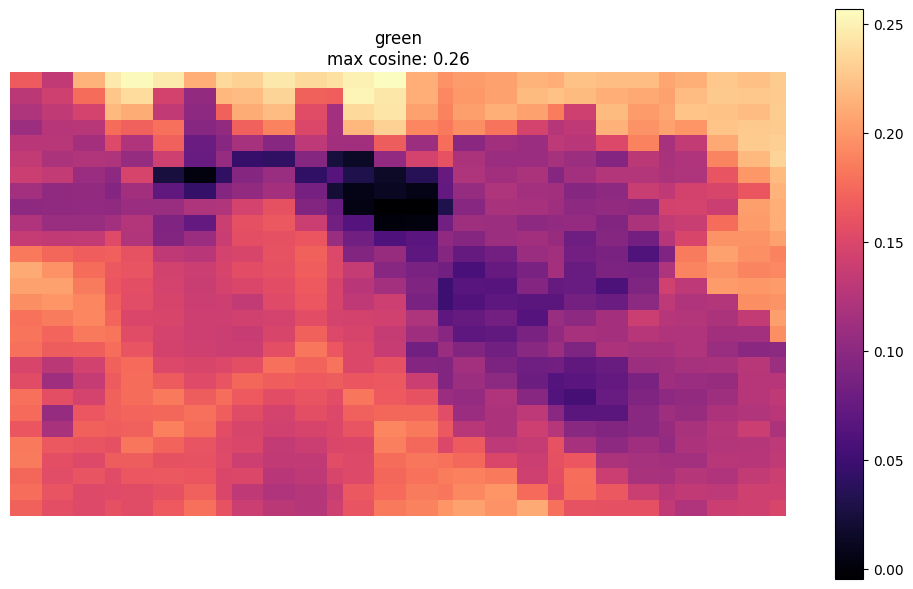

In [11]:
text = ['green']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


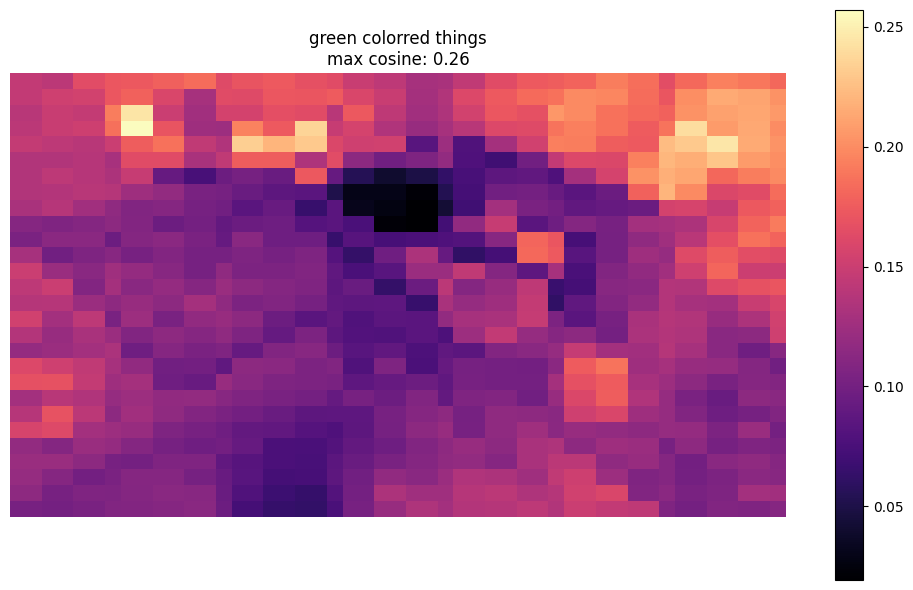

In [12]:
text = ['green colorred things']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


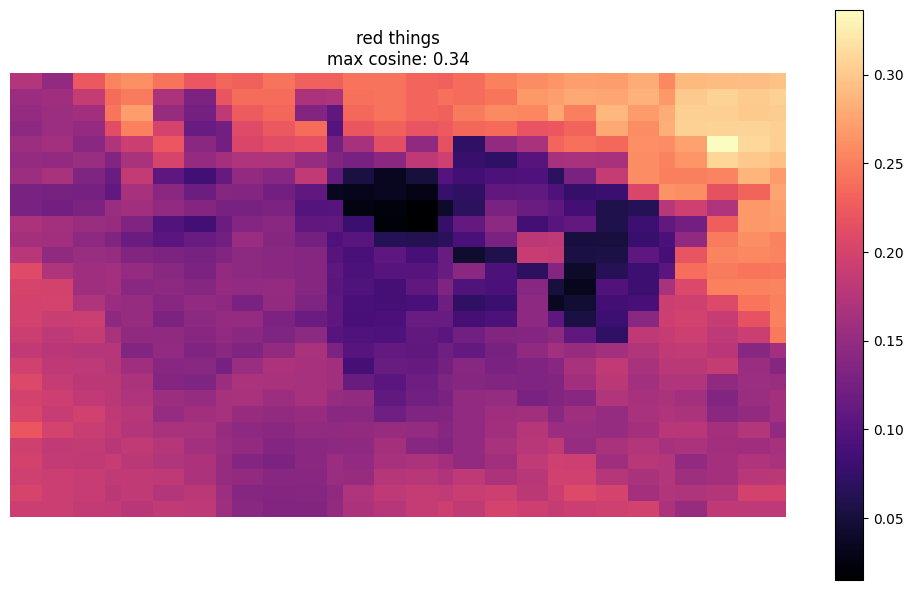

In [13]:
text = ['red things']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


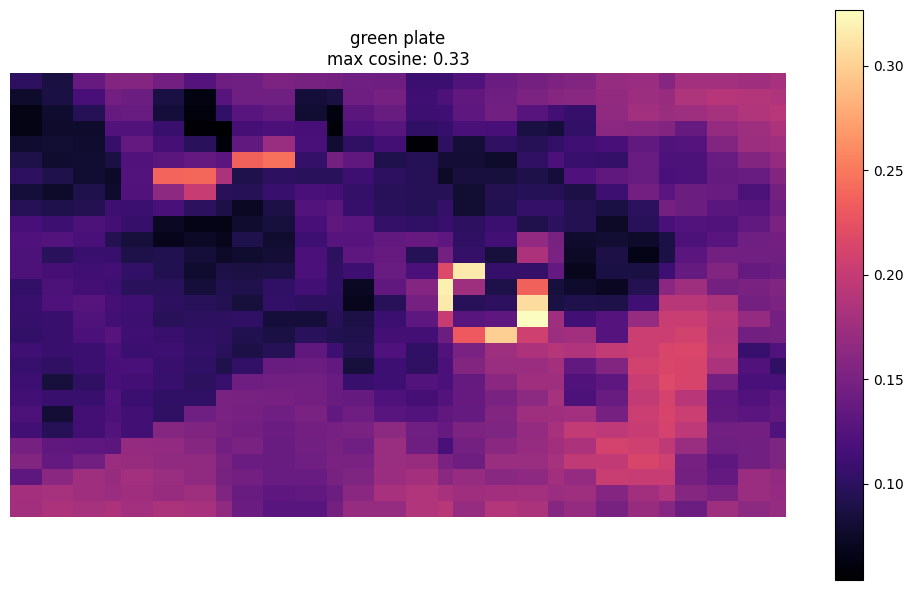

In [14]:
text = ['green plate']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


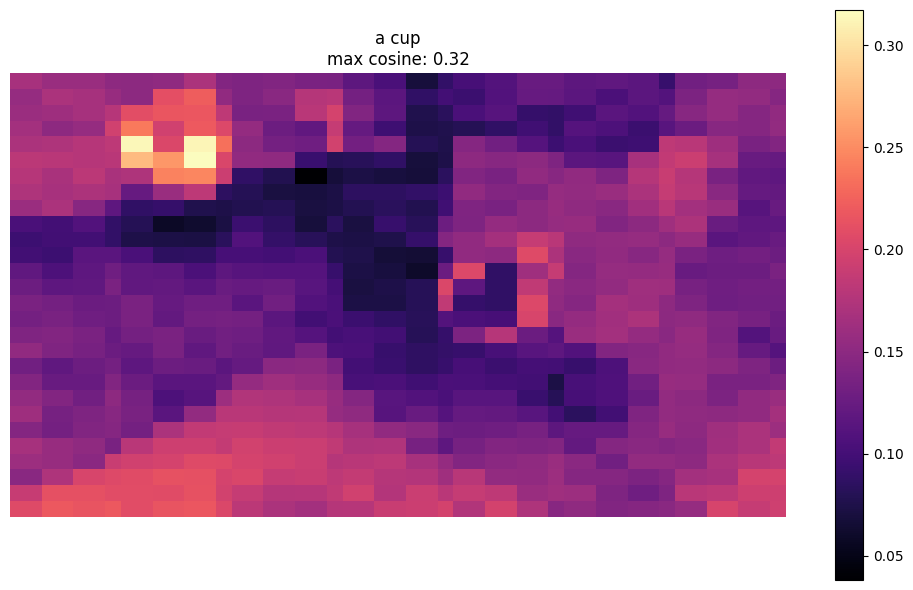

In [15]:
text = ['a cup']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


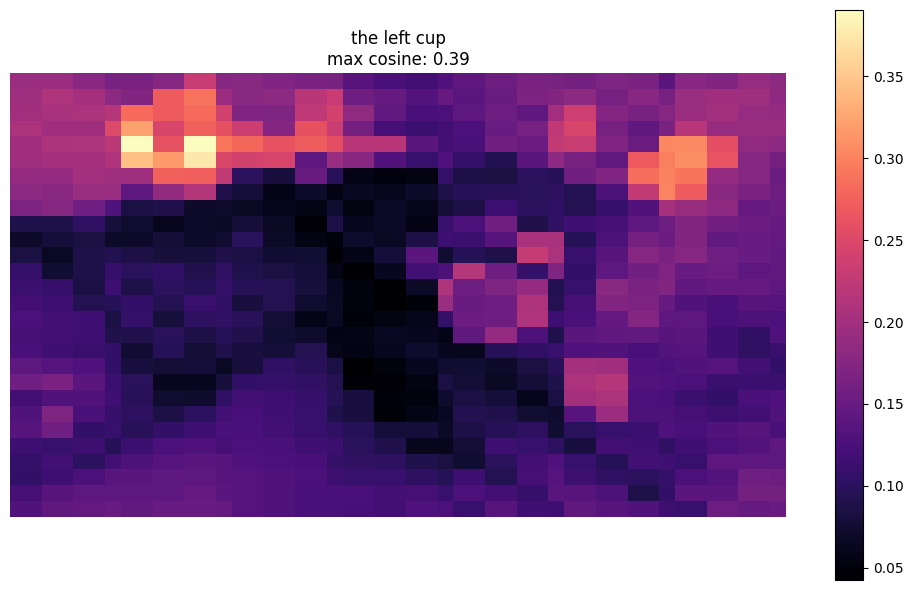

In [16]:
text = ['the left cup']
regenerate_all()

input_res=(181, 278)


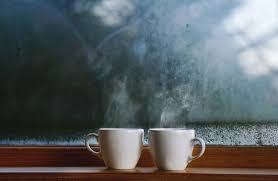

In [17]:
read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/left_right.jpg')
image

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


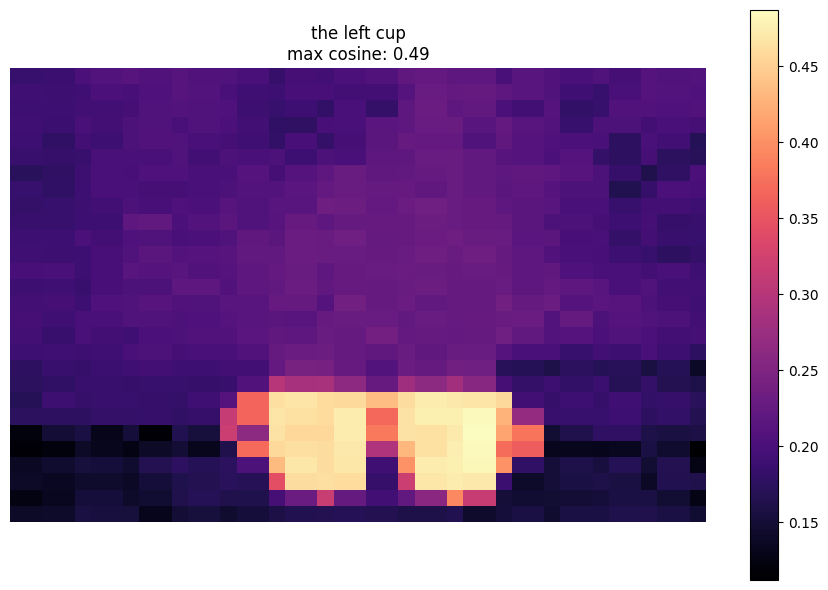

In [18]:
text = ['the left cup']
regenerate_all()

input_res=(880, 1351)


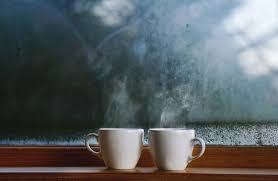

In [19]:
read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/left_right.jpg', [880])
image

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


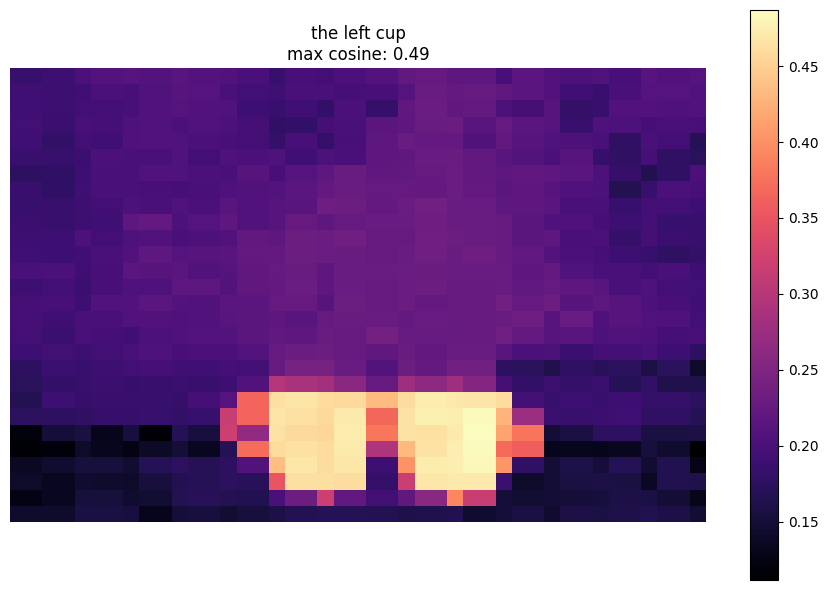

In [20]:
text = ['the left cup']
regenerate_all()

input_res=(186, 271)


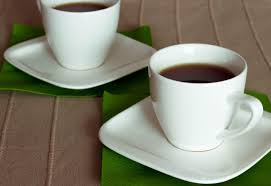

In [21]:
read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/paralax_cup.jpg')
image

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


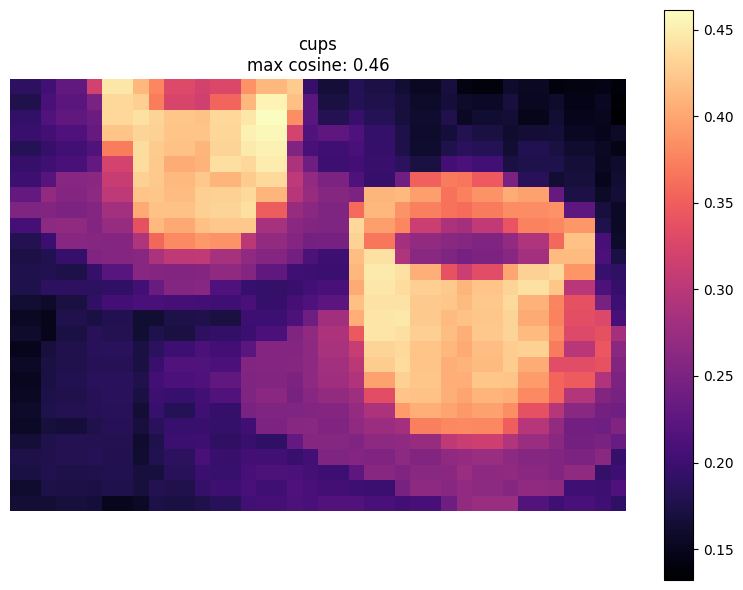

In [22]:
text = ['cups']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


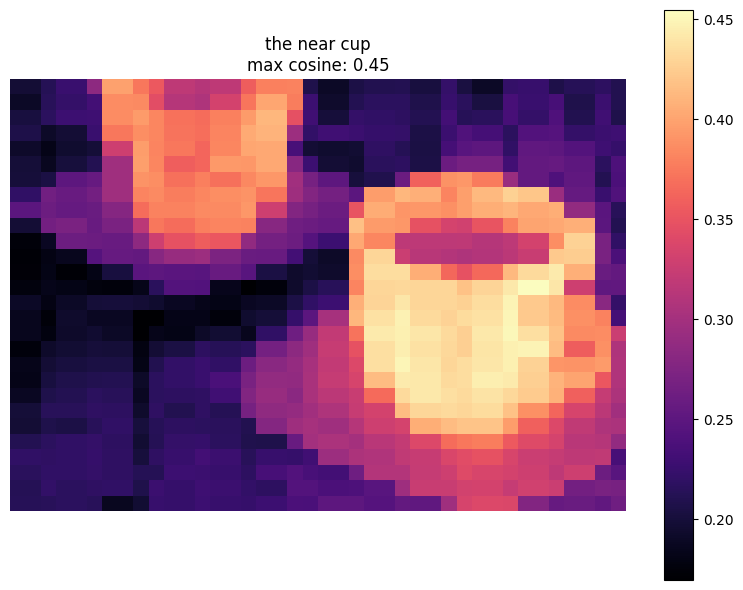

In [23]:
text = ['the near cup']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


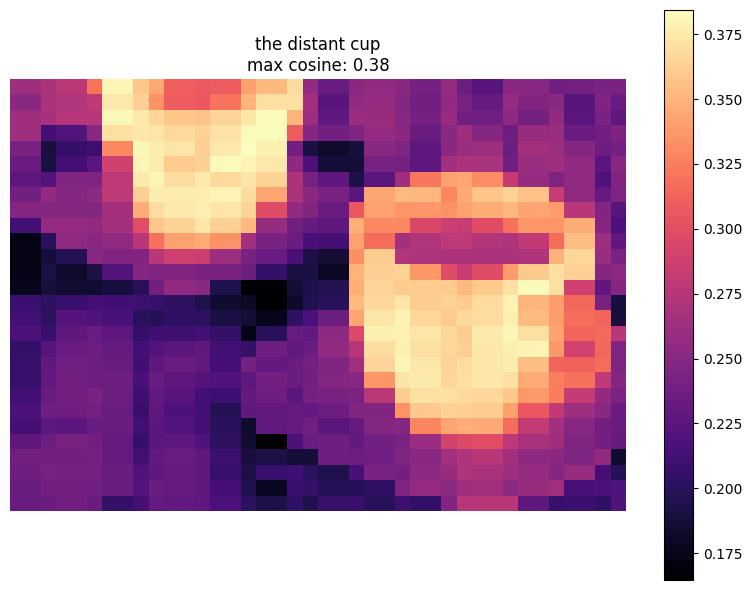

In [24]:
text = ['the distant cup']
regenerate_all()

input_res=(1125, 1500)


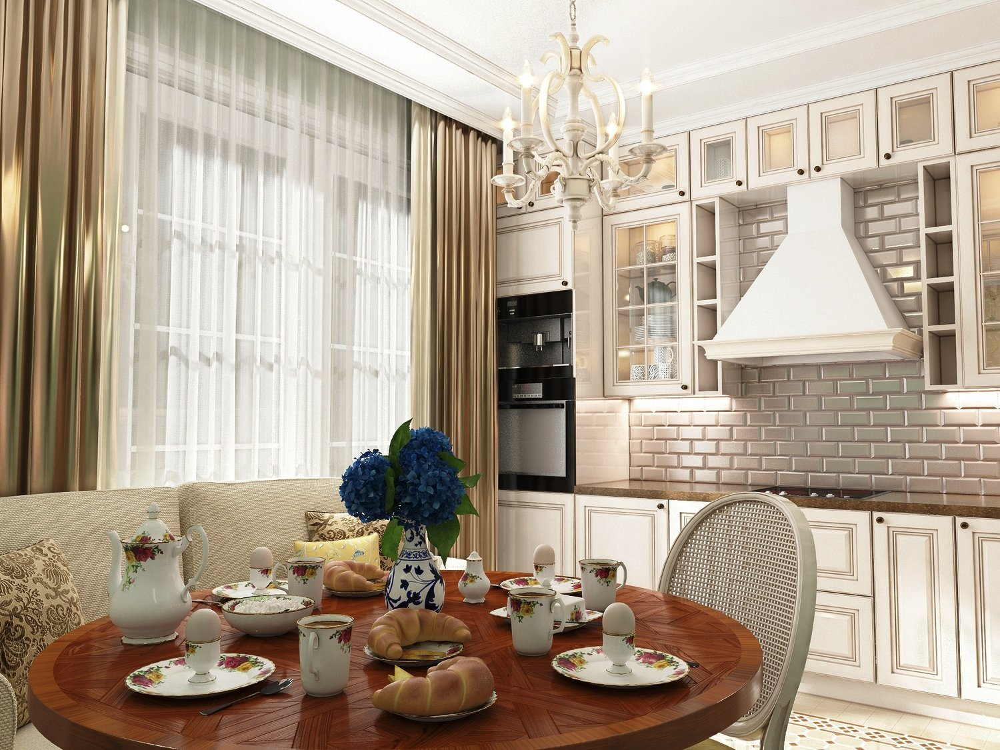

In [25]:
read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/many_things.jpg')
image

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


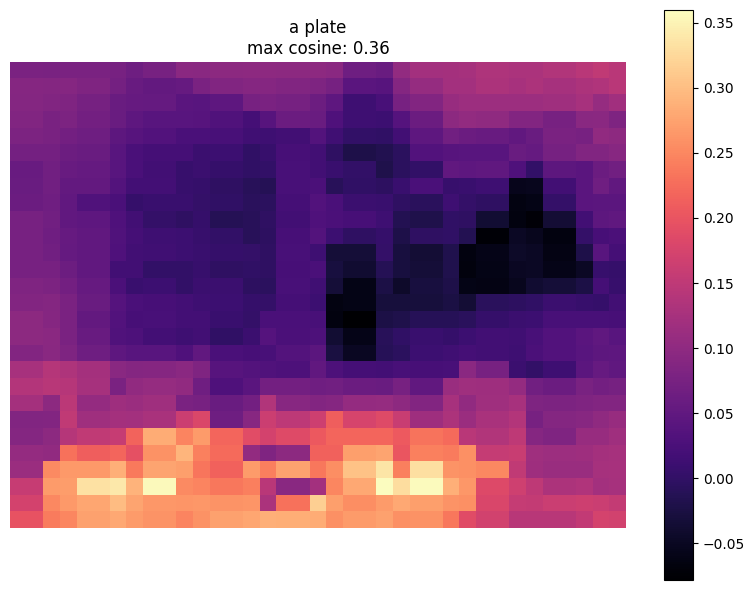

In [26]:
text = ['a plate']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


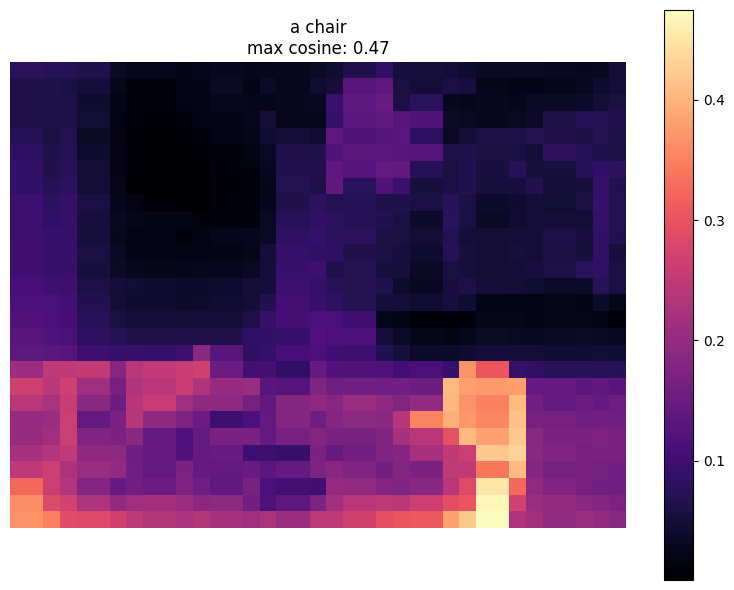

In [27]:
text = ['a chair']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


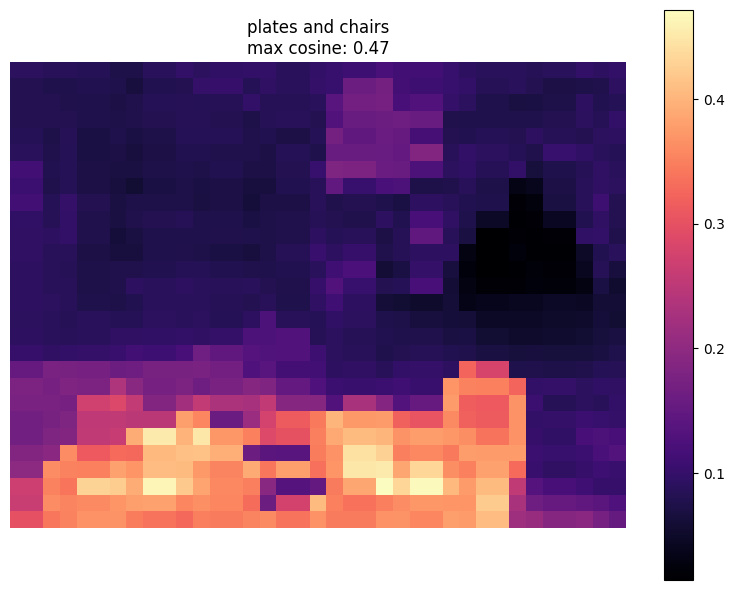

In [28]:
text = ['plates and chairs']
regenerate_all()

input_res=(981, 736)


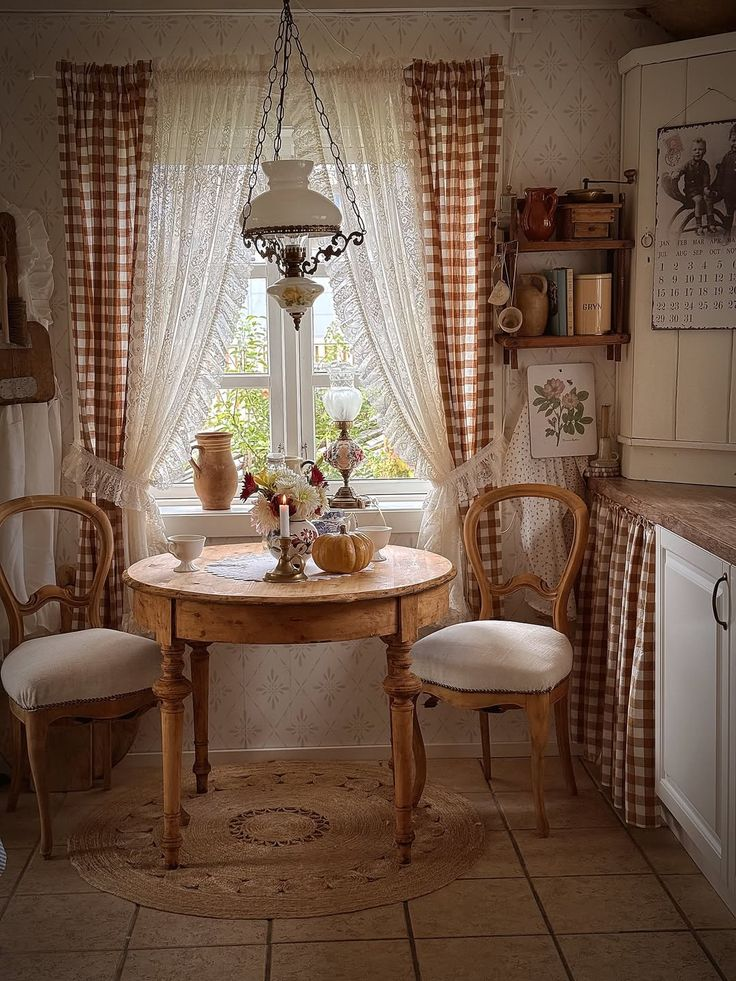

In [29]:
read_img('/home/bashmac/MIPT/test_SLAM/demos/test_ovf/many_things2.jpg')
image

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


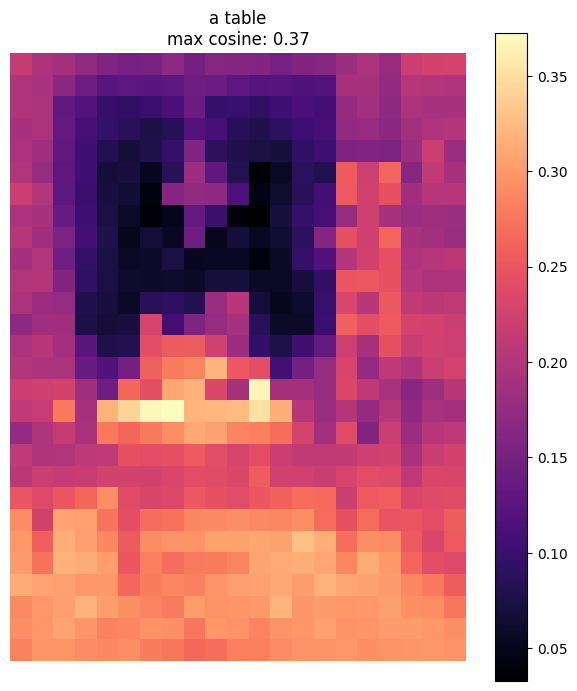

In [30]:
text = ['a table']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


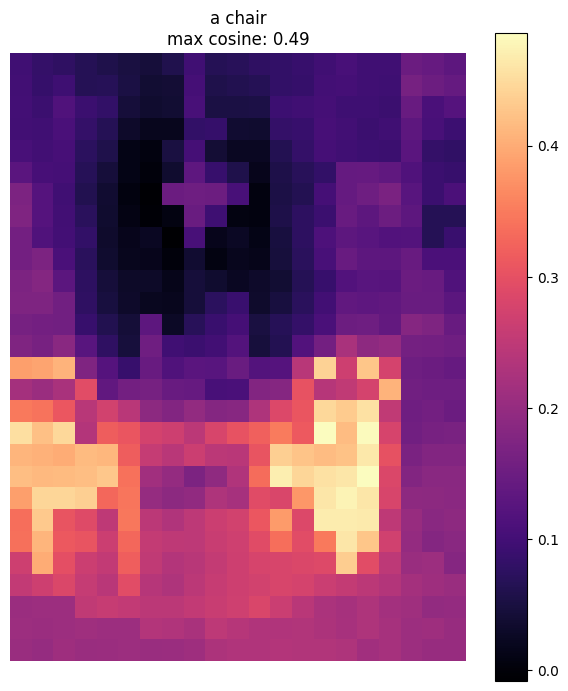

In [31]:
text = ['a chair']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


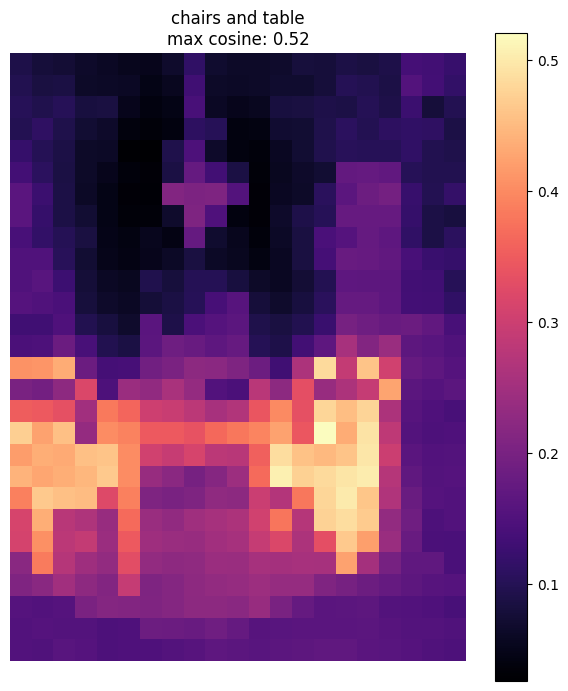

In [32]:
text = ['chairs and table']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


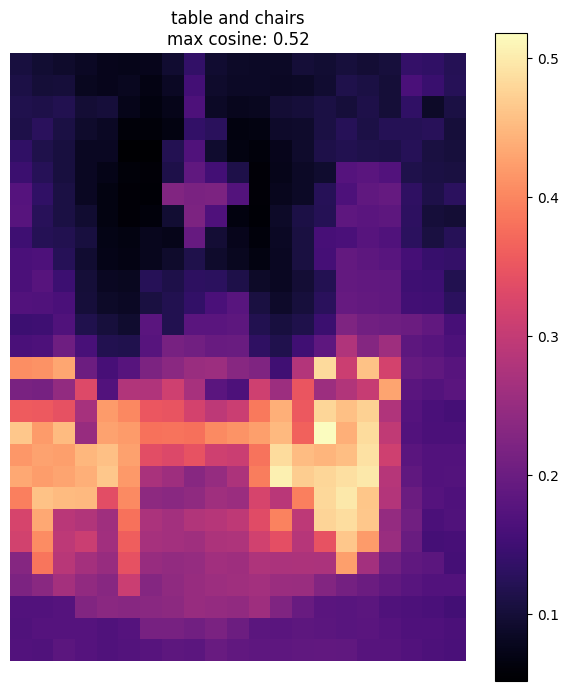

In [33]:
text = ['table and chairs']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


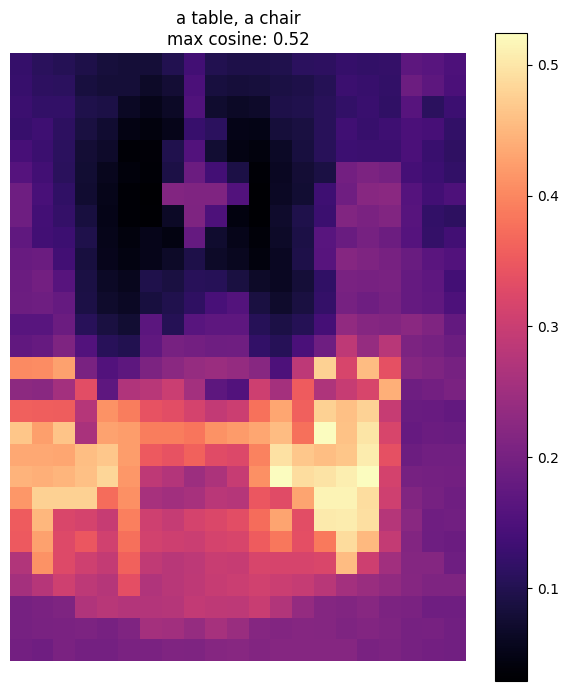

In [34]:
text = ['a table, a chair']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


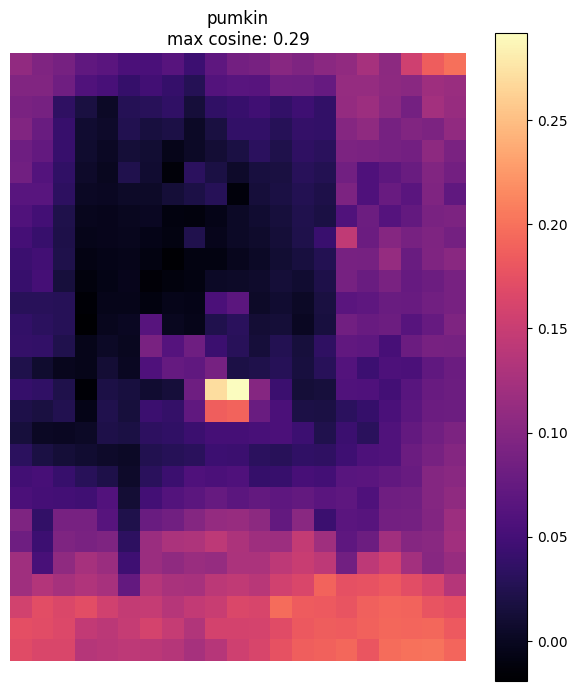

In [35]:
text = ['pumkin']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


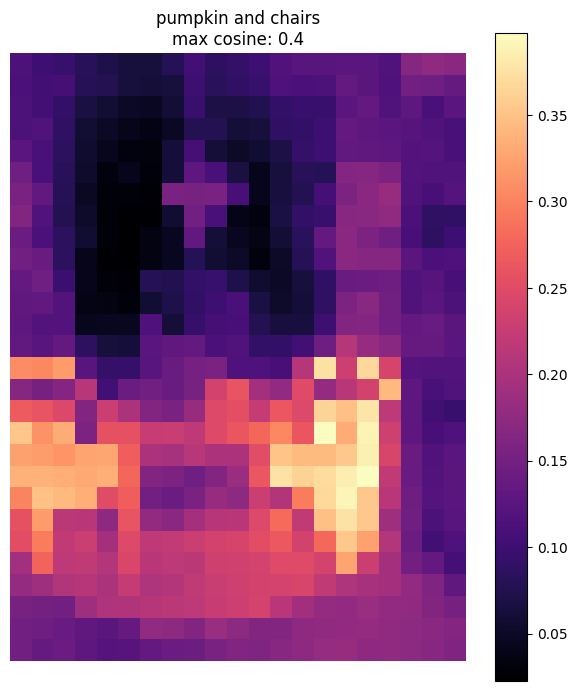

In [36]:
text = ['pumpkin and chairs']
regenerate_all()

Тыква имеет симметрию 0.29, а стулья -- 0.40. Из-за этого при поиске обоих предметов, хитмап больше подсвечивает стулья, хотя тыкву модель тоже находит. Сегментация по порогу тут будет сложной...

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


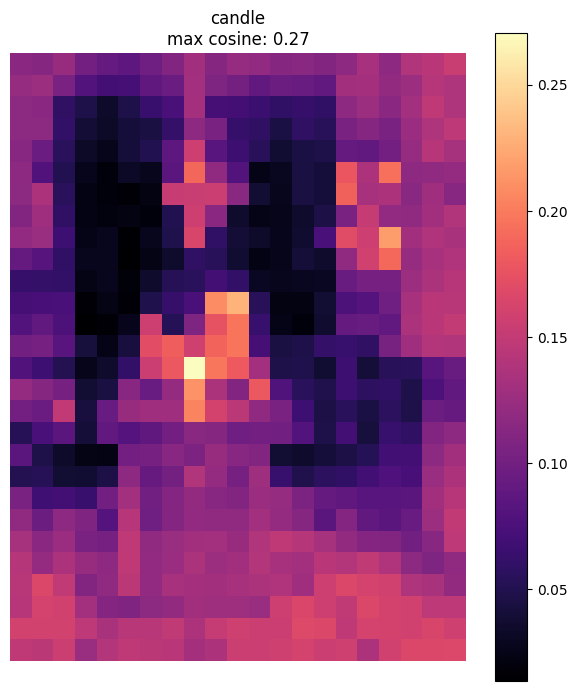

In [37]:
text = ['candle']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


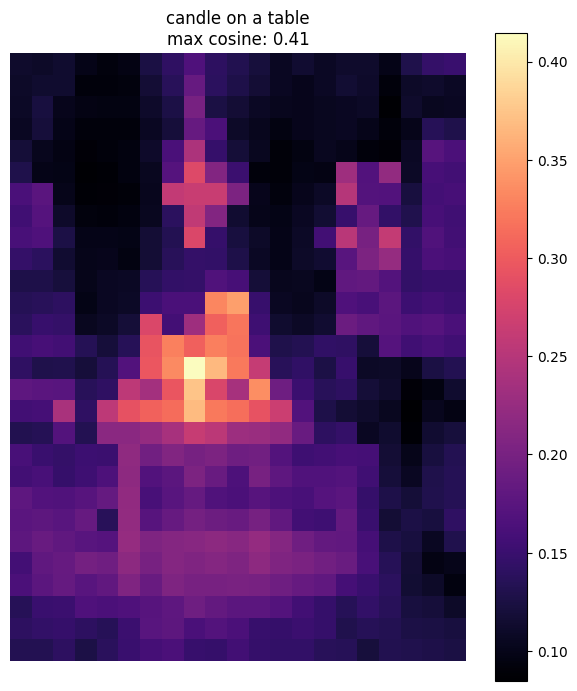

In [38]:
text = ['candle on a table']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


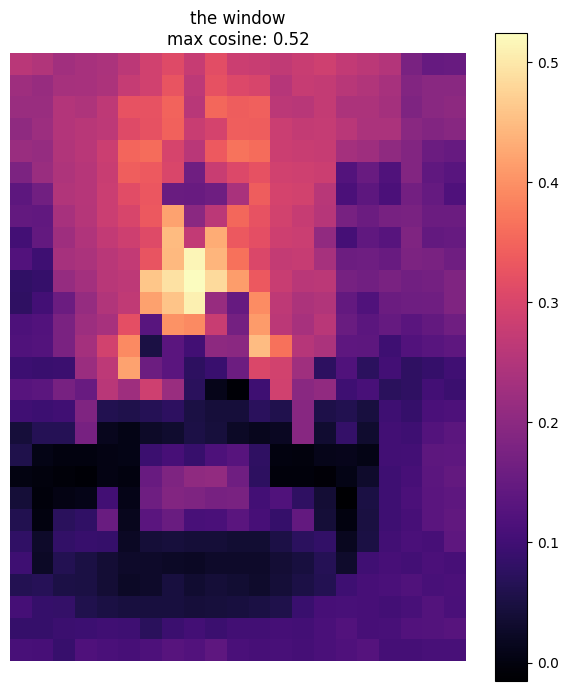

In [39]:
text = ['the window']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


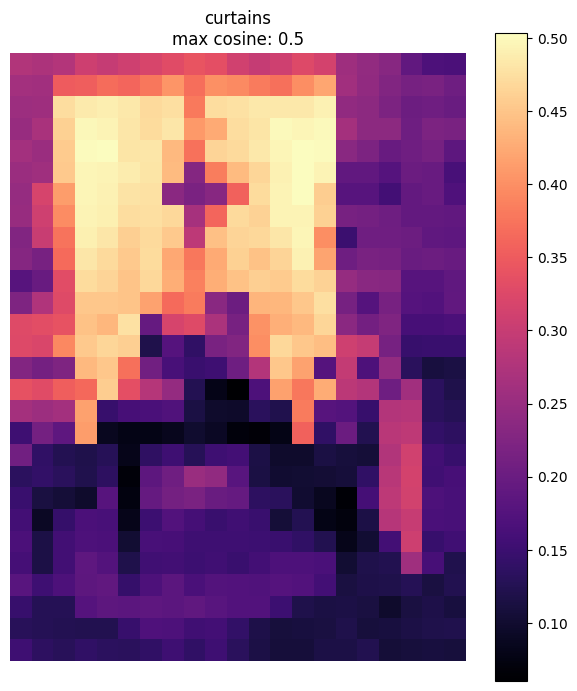

In [40]:
text = ['curtains']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


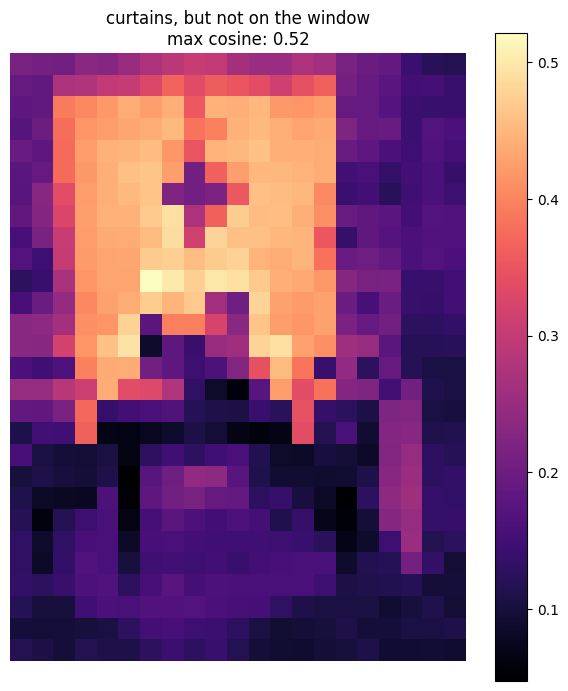

In [41]:
text = ['curtains, but not on the window']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


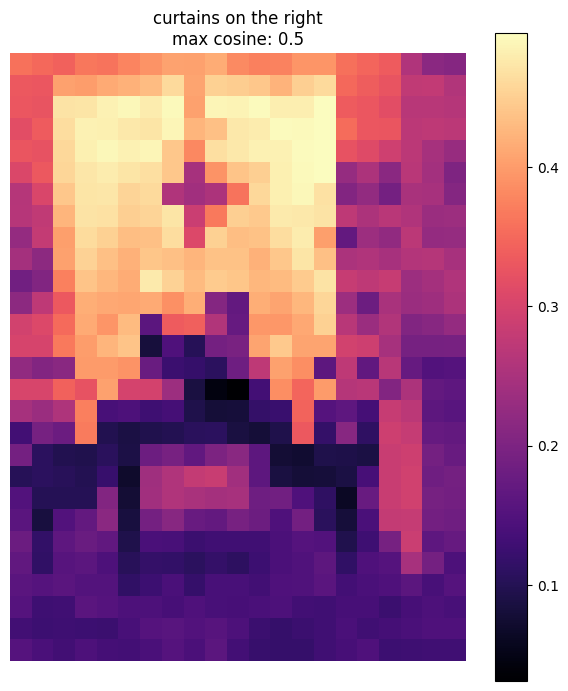

In [42]:
text = ['curtains on the right']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


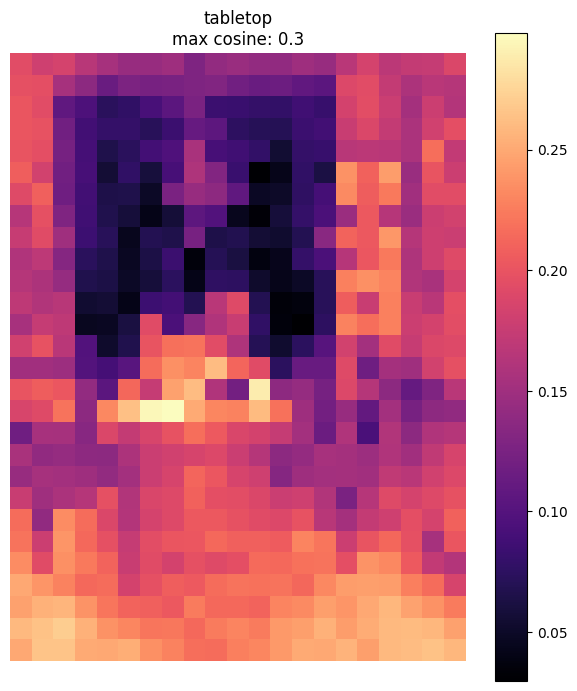

In [43]:
text = ['tabletop']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


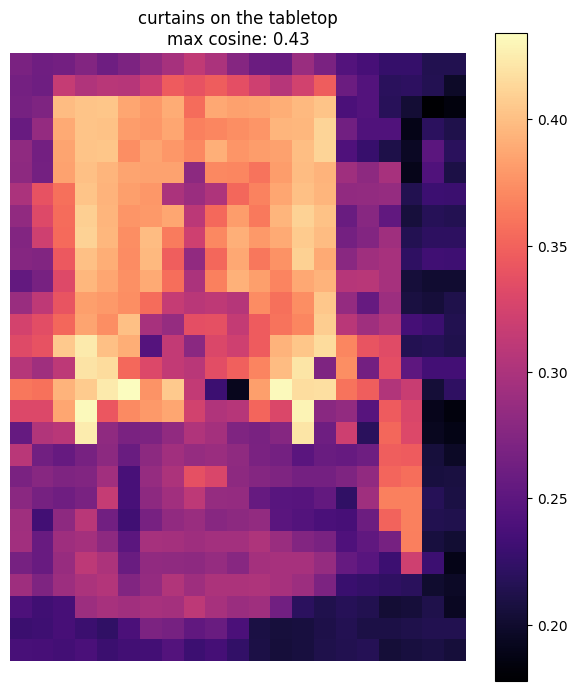

In [44]:
text = ['curtains on the tabletop']
regenerate_all()

similarity_reshaped.shape=torch.Size([1, 1, 28, 28])


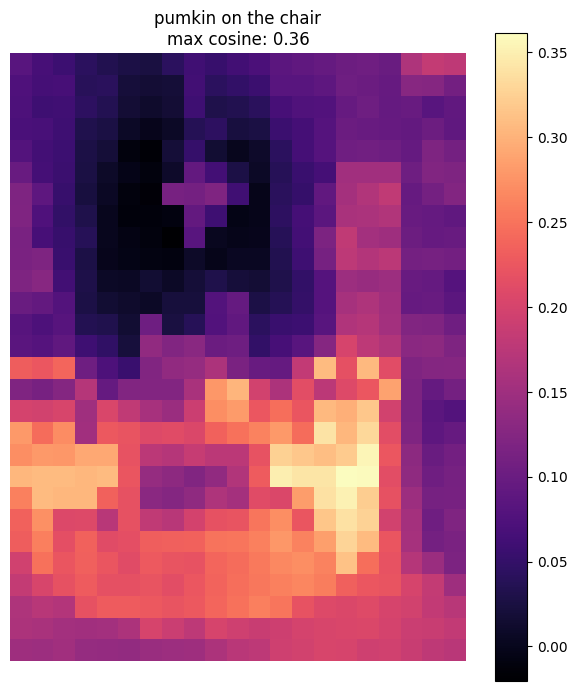

In [45]:
text = ['pumkin on the chair']
regenerate_all()